# YouTube Top Trending Video Analysis Code

Analysis performed by Harleen Kaur and Amelia Meyer

#### Sections
[Loading Packages and Data](#loading)   
[Initial Exploratory Calculations](#initial)  
[Visualization](#visual)  
[Word Cloud](#cloud)  

### This is the doc I'm using to make the big changes as he suggested

<a name="loading"/>

## Loading Packages and Data

In [2]:
# load packages
import pandas as pd
import numpy as np
import altair as alt
import random
# !pip install wordcloud
from wordcloud import WordCloud
from wordcloud import ImageColorGenerator
from wordcloud import STOPWORDS
import matplotlib.pyplot as plt

In [5]:
# load new csv
# trending = pd.read_csv('/home/jovyan/pstat100-w22-content/project/trending.csv')
trending = pd.read_csv(r'C:\Users\candy\Downloads\PSTAT100-FINALPROJECT\trending.csv')

# print a few example rows of dataset in tidy format
trending.drop(columns=['Unnamed: 0'], inplace=True)

trending.head(4)

,title,date_published,channel_name,category,trending_date,tags,view_count,likes,dislikes,comment_count,comments_disabled,ratings_disabled,year_published,month_published,year_trending,month_trending
0,I ASKED HER TO BE MY GIRLFRIEND...,2020-08-11,Brawadis,People & Blogs,2020-08-12,brawadis|prank|basketball|skits|ghost|funny vi...,1514614,156908,5855,35313,False,False,2020,8,2020,8
1,Apex Legends | Stories from the Outlands – “Th...,2020-08-11,Apex Legends,Gaming,2020-08-12,Apex Legends|Apex Legends characters|new Apex ...,2381688,146739,2794,16549,False,False,2020,8,2020,8
2,I left youtube for a month and THIS is what ha...,2020-08-11,jacksepticeye,Entertainment,2020-08-12,jacksepticeye|funny|funny meme|memes|jacksepti...,2038853,353787,2628,40221,False,False,2020,8,2020,8
3,XXL 2020 Freshman Class Revealed - Official An...,2020-08-11,XXL,Music,2020-08-12,xxl freshman|xxl freshmen|2020 xxl freshman|20...,496771,23251,1856,7647,False,False,2020,8,2020,8


In [6]:
# check for missing data
trending.isna().sum()

title                0
date_published       0
channel_name         0
category             0
trending_date        0
tags                 0
view_count           0
likes                0
dislikes             0
comment_count        0
comments_disabled    0
ratings_disabled     0
year_published       0
month_published      0
year_trending        0
month_trending       0
dtype: int64

<a name="initial"/>

## Initial Exploratory Calculations

In [39]:
# visualize number of comments_disabled
com_disabled = trending.groupby('comments_disabled').size()

com_disabled

comments_disabled
False    112252
True       1739
dtype: int64

In [48]:
trending.shape

(113991, 16)

In [51]:
total_obs = trending.shape[0]

In [54]:
# proportion with comments disabled
# com_disabled[True]/com_disabled.sum()

# percent with comments disabled
(com_disabled[True]/total_obs)*100

1.5255590353624409

In [42]:
# visualize number of ratings disabled
trending.groupby('ratings_disabled').size()

ratings_disabled
False    113212
True        779
dtype: int64

In [10]:
# number of unique years
trending.year_trending.unique()

array([2020, 2021, 2022], dtype=int64)

In [11]:
# Most viewed video
trending.title.iloc[trending.view_count.idxmax()]

"BTS (방탄소년단) 'Butter' Official MV"

In [12]:
# Most liked video
trending.title.iloc[trending.likes.idxmax()]

"BTS (방탄소년단) 'Butter' Official MV"

In [13]:
# Max dislikes for all trending videos
trending.title.iloc[trending.dislikes.idxmax()]

"BLACKPINK - 'Ice Cream (with Selena Gomez)' M/V"

In [69]:
# video with max dislikes
trending.iloc[trending.dislikes.idxmax()]

title                  BLACKPINK - 'Ice Cream (with Selena Gomez)' M/V
date_published                                              2020-08-28
channel_name                                                 BLACKPINK
category                                                         Music
trending_date                                               2020-09-05
tags                 YG Entertainment|YG|와이지|K-pop|BLACKPINK|블랙핑크|블...
view_count                                                   184778248
likes                                                         11795670
dislikes                                                        879354
comment_count                                                  2735997
comments_disabled                                                False
ratings_disabled                                                 False
year_published                                                    2020
month_published                                                      8
year_t

In [71]:
# video with max likes
trending.iloc[trending.likes.idxmax()]

title                BTS (방탄소년단) 'Butter' Official MV
date_published                             2021-05-21
channel_name                              HYBE LABELS
category                                        Music
trending_date                              2021-05-30
tags                  BIGHIT|빅히트|방탄소년단|BTS|BANGTAN|방탄
view_count                                  264407389
likes                                        16021534
dislikes                                       150989
comment_count                                 6738537
comments_disabled                               False
ratings_disabled                                False
year_published                                   2021
month_published                                     5
year_trending                                    2021
month_trending                                      5
Name: 56374, dtype: object

In [60]:
trending.trending_date.max()

'2022-02-28'

From the above, we can gather that $1739$ of the $113991$ videos in our Top Trending dataset have their comments disabled whhich is roughly $1.52 \%$. Interestingly, the number of videos that have ratings disabled - $779$ - is more than half those with comments disabled. Begs the question - is it easier to bare bad ratings that bad comments, assuming the comments were negative. I know there are videos that disable comments on default. Our dataset spans 3 years: 2020, 2021, and 2022, although the data for 2022 doesn't extend beyond February 28th. The most viewed video, i.e. the video with the most views, is "BTS (방탄소년단) 'Butter' Official MV" a music video. This is also the video with the most likes within our dataset. The video with the most dislikes is "BLACKPINK - 'Ice Cream (with Selena Gomez)' M/V". 

In [103]:
# average number of likes per year
trending.groupby('year_trending').mean()

,view_count,likes,dislikes,comment_count,comments_disabled,ratings_disabled,year_published,month_published,month_trending
year_trending,,,,,,,,,
2020,2.734677e+06,159627.122192,3789.870488,17915.884150,0.015509,0.007392,2020.000000,10.006378,10.123098
2021,2.810777e+06,149953.762343,2685.083169,11674.768939,0.016127,0.007011,2020.984771,6.537583,6.501615
2022,1.994340e+06,106351.483559,0.000000,5107.288305,0.009153,0.004407,2021.935085,2.131017,1.474576


In [121]:
# count how many times each title appears 
# trending.title.value_counts()

# trending.groupby('year_trending').title.value_counts()

# the following shows how many times each title appears on the trending list in 2022
trending2020 = trending[trending.year_trending == 2020]
trending2020.title.value_counts()

Starlink Mission                                                                27
Justin Bieber - Holy ft. Chance The Rapper                                      27
Mike Tyson and Roy Jones Jr hilarious joint interview after their exhibition    17
we broke up                                                                     13
What Really Happened                                                            13
                                                                                ..
Steelers vs. Ravens Week 8 Highlights | NFL 2020                                 1
Chargers vs. Broncos Week 8 Highlights | NFL 2020                                1
BTS: HOME                                                                        1
Why Don't We - Fallin' Trailer                                                   1
Haircut machine V2: future of haircutting?                                       1
Name: title, Length: 5390, dtype: int64

In [129]:
trending.groupby(['year_published', 'year_trending']).count().iloc[:,1]

year_published  year_trending
2020            2020             27596
                2021              1136
2021            2021             73459
                2022               766
2022            2022             11034
Name: date_published, dtype: int64

In [132]:
trending.likes.mean()

147782.0044740374

In [133]:
trending.likes.median()

50726.0

<a name="visual"/>

# Visualization

### Which genres are most popular?

In [207]:
categories = trending.category.value_counts().reset_index().rename(columns = {'index':'category', 'category':'count'})
categories

,category,count
0,Entertainment,22956
1,Gaming,20437
2,Music,19558
3,Sports,12204
4,People & Blogs,10302
5,Comedy,6561
6,Film & Animation,4486
7,News & Politics,4077
8,Science & Technology,3859
9,Howto & Style,3599


In [210]:
# bar chart of categories and counts
alt.Chart(categories).mark_bar().encode(
    x = 'category',
    y = 'count'
)

alt.Chart(...)

### Categories by year

There's probably an easier way to do this but my brain is mush rn. 

In [233]:
categories2020 = trending[trending.year_trending == 2020].category.value_counts().reset_index().rename(columns = {'index':'category', 'category':'count'})
categories2020['year'] = 2020
categories2021= trending[trending.year_trending == 2021].category.value_counts().reset_index().rename(columns = {'index':'category', 'category':'count'})
categories2021['year'] = 2021
categories2022 = trending[trending.year_trending == 2022].category.value_counts().reset_index().rename(columns = {'index':'category', 'category':'count'})
categories2022['year'] = 2022
categories_years = pd.concat([categories2020, categories2021, categories2022])
categories_years


,category,count,year
0,Music,6237,2020
1,Entertainment,5299,2020
2,Sports,3284,2020
3,Gaming,2617,2020
4,People & Blogs,2281,2020
5,Comedy,1677,2020
6,Science & Technology,1318,2020
7,Howto & Style,1310,2020
8,Film & Animation,1059,2020
9,News & Politics,1038,2020


In [234]:
# bar chart of categories and counts
alt.Chart(categories_years).mark_bar().encode(
    x = 'category',
    y = 'count'
).facet(
    column = 'year')

alt.FacetChart(...)

### Views vs Likes

Difference between views and likes

Q2 Is there a relationship between comments being disabled and the number of dislikes? Do videos with more likes have a bigger proportion of dislikes?**
Comments/ ratings disabled
        ⁃       Which genres?
        ⁃       Do these have higher amount of views or likes? Well they are trending?
        ⁃       How are they trending if they don’t have any engagement.. only views and likes?
        ⁃       Does negative feedback prompt individuals to disable?

In [250]:
# create new column with the proportion of dislikes
trending['proportion_dislikes'] = trending.dislikes/trending.likes
trending.groupby('comments_disabled').count().iloc[:,1]


comments_disabled
False    112252
True       1739
Name: date_published, dtype: int64

### Scatterplots

In [38]:
# to perform graphics on data >5000 observations, we have to disable the max rows altair implements
# alt.data_transformers.disable_max_rows()

In [15]:
# basic scatterplot with large dataset
# alt.Chart(trending).mark_circle().encode(
#    x = 'view_count',
#    y = 'likes'
#)

In [160]:
# take a random sample for visualization
trending_sample = trending.sample(n = 5000)

In [255]:
# general scatterplot
# create a random seed for reproducibility
random.seed(200)

# create scattterplot of likes vs views
likes_v_views = alt.Chart(trending_sample).mark_circle().encode(
    x = alt.X('view_count',scale = alt.Scale(type = 'sqrt')),
    y = 'likes',
    size = alt.Size('comment_count')
)

# print scatterplot
likes_v_views

alt.Chart(...)

In [162]:
# take a random sample for visualization
trending_sample2 = trending.sample(n = 100)

In [163]:
# general scatterplot
# create a random seed for reproducibility
random.seed(200)

# create scattterplot of likes vs views
likes_v_views = alt.Chart(trending_sample2).mark_circle().encode(
    x = alt.X('view_count',scale = alt.Scale(type = 'log')),
    y = 'likes',
)

# print scatterplot
likes_v_views

alt.Chart(...)

In [164]:
# create a random seed for reproducibility
random.seed(200)

# create facetted scattterplot of likes vs views
likes_v_views = alt.Chart(trending_sample2).mark_circle().encode(
    x = alt.X('view_count',scale = alt.Scale(type = 'log')),
    y = 'likes',
    
).facet(
    column = 'year_trending'
)

# print scatterplot
likes_v_views

alt.FacetChart(...)

In [179]:
# create a random seed for reproducibility
random.seed(200)

# create facetted scattterplot of likes vs views
likes_v_views = alt.Chart(trending_sample).mark_circle().encode(
    x = 'view_count',
    y = 'likes',
).facet(
    column = 'year_trending'
)

# print scatterplot
likes_v_views

alt.FacetChart(...)

In [180]:
# calculate median of sample
sample_med = trending_sample.view_count.median()

sample_med

1059770.0

In [181]:
# We can see some pretty large outliers, so let's modify our plots to zoom in and only show values less than our median
likes_v_views_scaled = likes_v_views.transform_filter(
    alt.FieldLTPredicate(field = 'view_count', lt = sample_med)
)

likes_v_views_scaled

alt.FacetChart(...)

In [182]:
# checking whether there are any times the likes are 0 and ratings are not disabled
trending_sample[(trending_sample.likes == 0) & (trending_sample.ratings_disabled == False)].count()

title                0
date_published       0
channel_name         0
category             0
trending_date        0
tags                 0
view_count           0
likes                0
dislikes             0
comment_count        0
comments_disabled    0
ratings_disabled     0
year_published       0
month_published      0
year_trending        0
month_trending       0
dtype: int64

In [184]:
# create a new dataset with only the videos that have ratings enabled
trending_ratings_enabled = trending_sample[trending_sample.ratings_disabled == False]

trending_ratings_enabled.likes.min()

28

In [190]:
# plot of ratings
alt.Chart(trending_ratings_enabled).transform_filter(
    alt.FieldEqualPredicate(field = 'year_trending', 
                            equal = 2022)
).mark_bar().encode(
    x = alt.X('likes', 
              bin = alt.Bin(step = 100000), 
              title = 'Number of Likes'),
    y = 'count()'
)

alt.Chart(...)

In [ ]:
base = alt.Chart(trending_sample).properties(height = 200)

hist = base.mark_bar(opacity = 0.5, color = 'red').encode(
    x = alt.X('length', 
              bin = alt.Bin(maxbins = 40), 
              scale = alt.Scale(domain = (40, 70)),
              title = 'length (cm)'),
    y = alt.Y('count()', 
              stack = None,
              title = 'number of birds')
)

hist_bysex = hist.encode(color = 'sex').properties(height = 100)

hist_bysex & hist

<a name="cloud"/>

## Word Cloud

#### Absolve tags Column Into List

In [29]:
# I'm doing this in a copy dataset so as not to alter our original but we can replace it later on if we want

# copy tidy dataset
trending_copy = trending.copy()

# create list of tags for each observation and replace the original tags column with it   
trending_copy["tags"]= trending_copy["tags"].str.split("|")

In [30]:
trending_copy.head(4)

,title,date_published,channel_name,category,trending_date,tags,view_count,likes,dislikes,comment_count,comments_disabled,ratings_disabled,year_published,month_published,year_trending,month_trending
0,I ASKED HER TO BE MY GIRLFRIEND...,2020-08-11,Brawadis,People & Blogs,2020-08-12,"[brawadis, prank, basketball, skits, ghost, fu...",1514614,156908,5855,35313,False,False,2020,8,2020,8
1,Apex Legends | Stories from the Outlands – “Th...,2020-08-11,Apex Legends,Gaming,2020-08-12,"[Apex Legends, Apex Legends characters, new Ap...",2381688,146739,2794,16549,False,False,2020,8,2020,8
2,I left youtube for a month and THIS is what ha...,2020-08-11,jacksepticeye,Entertainment,2020-08-12,"[jacksepticeye, funny, funny meme, memes, jack...",2038853,353787,2628,40221,False,False,2020,8,2020,8
3,XXL 2020 Freshman Class Revealed - Official An...,2020-08-11,XXL,Music,2020-08-12,"[xxl freshman, xxl freshmen, 2020 xxl freshman...",496771,23251,1856,7647,False,False,2020,8,2020,8


In [31]:
# making sure I didn't produce any na's
trending_copy.isna().sum().sum()

0

In [32]:
trending_copy.tags.head(4)

0    [brawadis, prank, basketball, skits, ghost, fu...
1    [Apex Legends, Apex Legends characters, new Ap...
2    [jacksepticeye, funny, funny meme, memes, jack...
3    [xxl freshman, xxl freshmen, 2020 xxl freshman...
Name: tags, dtype: object

In [33]:
# create a giant series of lists of tags
list_of_tags = pd.Series(trending_copy.tags).explode()

list_of_tags

0           brawadis
0              prank
0         basketball
0              skits
0              ghost
             ...    
113990           six
113990        teaser
113990       trailer
113990          luke
113990           ryu
Name: tags, Length: 1895538, dtype: object

Next I will be following [this](https://thecleverprogrammer.com/2021/11/11/word-cloud-from-a-pandas-dataframe-in-python/) website. 

Other wordcloud options:  
- [Datacamp](https://www.datacamp.com/community/tutorials/wordcloud-python)  
- [Bartosz Mikulski](https://www.mikulskibartosz.name/word-cloud-from-a-pandas-data-frame/)

In [34]:
trending_copy.tags.isna().sum()

0

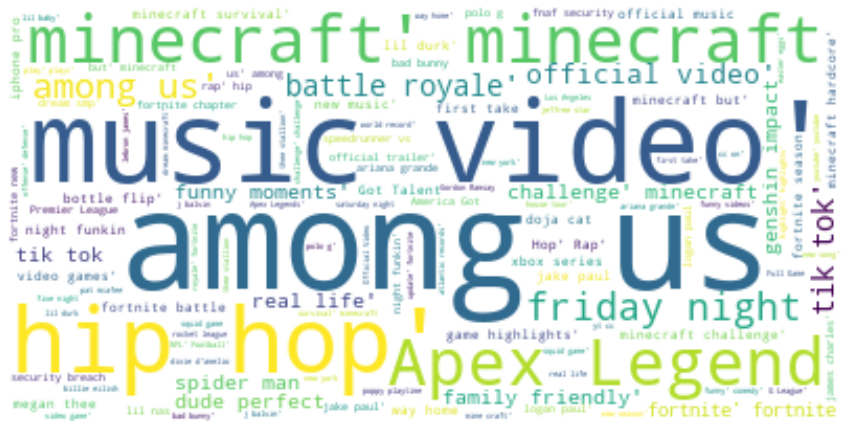

In [35]:
# create a text list of all words in column tags
text = " ".join(i for i in trending_copy.tags.astype(str))
# text = " ".join(i for i in data.text)

# set stopwords
stopwords = set(STOPWORDS)
stopwords.update(['None'])
# to update ex: stopwords.update(["bloom", "rose", "petals", "Average", "diameter","flushes", 'throughout', "Blooms", "form"])

# assign wordcloud
wordcloud = WordCloud(stopwords=stopwords, background_color="white").generate(text)

plt.figure( figsize=(15,10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.savefig("wordcloud_tags.png")
plt.show()

Possible further exploration:
- word cloud of tags
- likes/dislikes ratio vs views
- are videos with more dislikes liekly to have their comments off?
- change false and true values to 1's and zeroes for the two bool vars


## Comments from Trevor about the proposal:
**OVERALL: I'd like to see a bit more focus on some theme. I think if you want to understand popularity it would make sense to focus on views or likes (interesting question: what's the difference?) and see if other variables seem to explain the number of views/likes.** 

**EXPLORATORY ANALYSIS: maybe transform axes (log) so the data scatter is a bit more visible. i like the overall idea of looking at relationships between category, likes, views, and comments. is there a specific relationship that seems strong that you could show more clearly in these graphics?**     

**FURTHER: Q1 - look for patterns *among* the trending videos. do they exhibit some relationship between two or more variables? any pattern you *do* find you can't know for sure that it's *distinctive of* trending videos  Q2 - i like this; could you translate the question into more qualitative terms? like i can see you thinking about whether negative feedback might prompt someone to turn off comments and whether that's reflected in the data. so i think the question would be more interesting if it's phrased according to the motivating thought rather than in a stats-y way. could you say something more specific than 'look at'? any particular visualizations you want to make or 9
summaries you want to calculate?**   

## Harleen's Notes


Relationship between two or more variables   
        ⁃       PCA to analyze relationships among variables  
        ⁃       Correlation Matrix  
        ⁃       Calculate some summary tables  